# Inkference AR – TrOCR Fine-Tuning on READ Dataset

Fine-tuning of the best Bentham checkpoint (`checkpoints/best/`) on the READ Dataset (ICFHR 2016).  
Historical German administrative documents from Bolzano, ~16th–17th century.  
Metrics: Character Error Rate (CER) and Word Error Rate (WER).

## Step 1 – Understand the Dataset

The READ Dataset uses PAGE XML format: each page has a full-page JPG and an XML file  
containing polygon coordinates and transcriptions for every text line.  
Unlike Bentham, lines are **not** pre-segmented — we crop them from the full page in Step 2.

In [9]:
from pathlib import Path
import xml.etree.ElementTree as ET
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

ROOT     = Path("..")
READ_DIR = ROOT / "data" / "READDataset"

# Paths differ slightly between splits (Test has no Images/ subfolder)
SPLITS = {
    "train": {
        "images": READ_DIR / "Training" / "Images",
        "xmls":   READ_DIR / "Training" / "page" / "page",
    },
    "val": {
        "images": READ_DIR / "Validation" / "Images",
        "xmls":   READ_DIR / "Validation" / "page" / "page",
    },
    "test": {
        "images": READ_DIR / "Test-ICFHR-2016",          # JPGs sit directly here
        "xmls":   READ_DIR / "Test-ICFHR-2016" / "page", # XMLs one level deeper
    },
}

PAGE_NS = "http://schema.primaresearch.org/PAGE/gts/pagecontent/2013-07-15"

print("Paths present:")
for split, paths in SPLITS.items():
    for key, p in paths.items():
        print(f"  {'✓' if p.exists() else '✗'} [{split}/{key}] {p}")

Paths present:
  ✓ [train/images] ../data/READDataset/Training/Images
  ✓ [train/xmls] ../data/READDataset/Training/page/page
  ✓ [val/images] ../data/READDataset/Validation/Images
  ✓ [val/xmls] ../data/READDataset/Validation/page/page
  ✓ [test/images] ../data/READDataset/Test-ICFHR-2016
  ✓ [test/xmls] ../data/READDataset/Test-ICFHR-2016/page


In [10]:
# Count pages and text lines per split
ns = {"p": PAGE_NS}

for split, paths in SPLITS.items():
    n_images = len(list(paths["images"].glob("*.JPG")))
    n_xmls   = len(list(paths["xmls"].glob("*.xml")))

    total_lines = 0
    empty_lines = 0
    for xml_file in paths["xmls"].glob("*.xml"):
        tree = ET.parse(xml_file)
        for line in tree.getroot().findall(".//p:TextLine", ns):
            total_lines += 1
            u = line.find(".//p:Unicode", ns)
            if u is None or not (u.text or "").strip():
                empty_lines += 1

    usable = total_lines - empty_lines
    print(f"{split:6s} | {n_images:>4} pages | {n_xmls:>4} XMLs | "
          f"{total_lines:>5} lines total | {usable:>5} usable")

train  |  350 pages |  350 XMLs |  8367 lines total |  8366 usable
val    |   50 pages |   50 XMLs |  1043 lines total |  1040 usable
test   |   50 pages |   50 XMLs |  1140 lines total |  1138 usable


In [11]:
# Image format and size (sample from Training)
sample_imgs = sorted(SPLITS["train"]["images"].glob("*.JPG"))[:50]
widths, heights, modes = [], [], set()

for f in sample_imgs:
    img = Image.open(f)
    widths.append(img.size[0])
    heights.append(img.size[1])
    modes.add(img.mode)

print(f"Image modes  : {modes}  (no conversion needed — already RGB)")
print(f"Width        : min={min(widths)}, max={max(widths)}, median={sorted(widths)[len(widths)//2]}")
print(f"Height       : min={min(heights)}, max={max(heights)}, median={sorted(heights)[len(heights)//2]}")

Image modes  : {'RGB'}  (no conversion needed — already RGB)
Width        : min=2168, max=2562, median=2458
Height       : min=3495, max=3631, median=3543


In [12]:
# Sample transcriptions from one Training page
sample_xml = SPLITS["train"]["xmls"] / "Seite0001.xml"
tree = ET.parse(sample_xml)
root = tree.getroot()

print(f"Sample transcriptions from {sample_xml.name}:\n")
for i, line in enumerate(root.findall(".//p:TextLine", ns)[:10]):
    u      = line.find(".//p:Unicode", ns)
    coords = line.find("p:Coords", ns)
    pts    = coords.get("points") if coords is not None else ""
    xs     = [int(p.split(",")[0]) for p in pts.split()]
    ys     = [int(p.split(",")[1]) for p in pts.split()]
    bbox   = (min(xs), min(ys), max(xs), max(ys))
    text   = u.text.strip() if u is not None and u.text else "(empty)"
    print(f"  [{i:02d}] bbox={bbox}  →  '{text}'")

Sample transcriptions from Seite0001.xml:

  [00] bbox=(795, 138, 1590, 407)  →  '1620'
  [01] bbox=(285, 415, 1828, 642)  →  'Bestett- vnd Ersetz¬'
  [02] bbox=(577, 633, 1784, 739)  →  'üng. aines Ersamen Rats'
  [03] bbox=(583, 728, 1809, 838)  →  'der Statt Botzen. aūfs obge¬'
  [04] bbox=(766, 831, 1358, 915)  →  'melt Jar./.'
  [05] bbox=(1714, 194, 1799, 275)  →  '1'
  [06] bbox=(393, 1020, 1693, 1221)  →  'Die Herrn vom Adl:'
  [07] bbox=(244, 1209, 1810, 1406)  →  'Herr Jacob Khūeen von Be¬'
  [08] bbox=(486, 1384, 1810, 1505)  →  'läsÿ Zū Liechtenberg vnd Gandegg'
  [09] bbox=(432, 1488, 1756, 1606)  →  'Freÿherr aūf Neūen Lempach etc.'


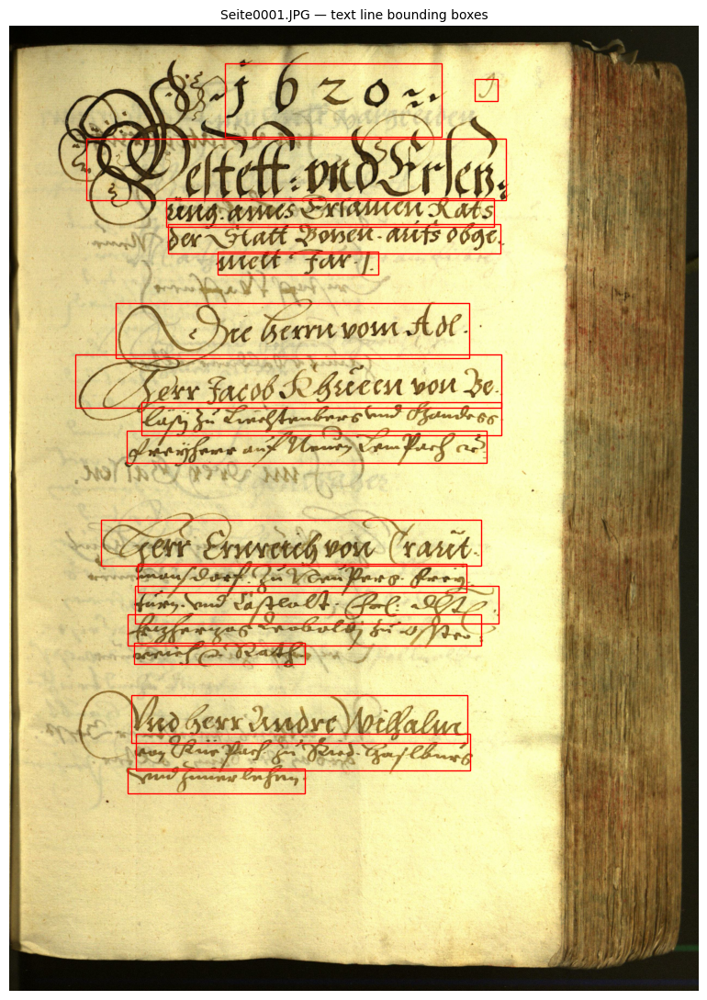

In [13]:
# Visualise one full page with bounding boxes overlaid
sample_img_path = SPLITS["train"]["images"] / "Seite0001.JPG"
sample_xml_path = SPLITS["train"]["xmls"]   / "Seite0001.xml"

page_img = Image.open(sample_img_path)
tree     = ET.parse(sample_xml_path)

fig, ax = plt.subplots(figsize=(8, 11))
ax.imshow(page_img)

for line in tree.getroot().findall(".//p:TextLine", ns):
    coords = line.find("p:Coords", ns)
    pts    = coords.get("points") if coords is not None else ""
    if not pts:
        continue
    xs = [int(p.split(",")[0]) for p in pts.split()]
    ys = [int(p.split(",")[1]) for p in pts.split()]
    x, y, w, h = min(xs), min(ys), max(xs) - min(xs), max(ys) - min(ys)
    ax.add_patch(patches.Rectangle((x, y), w, h, linewidth=1, edgecolor="red", facecolor="none"))

ax.set_title("Seite0001.JPG — text line bounding boxes", fontsize=10)
ax.axis("off")
plt.tight_layout()
plt.show()

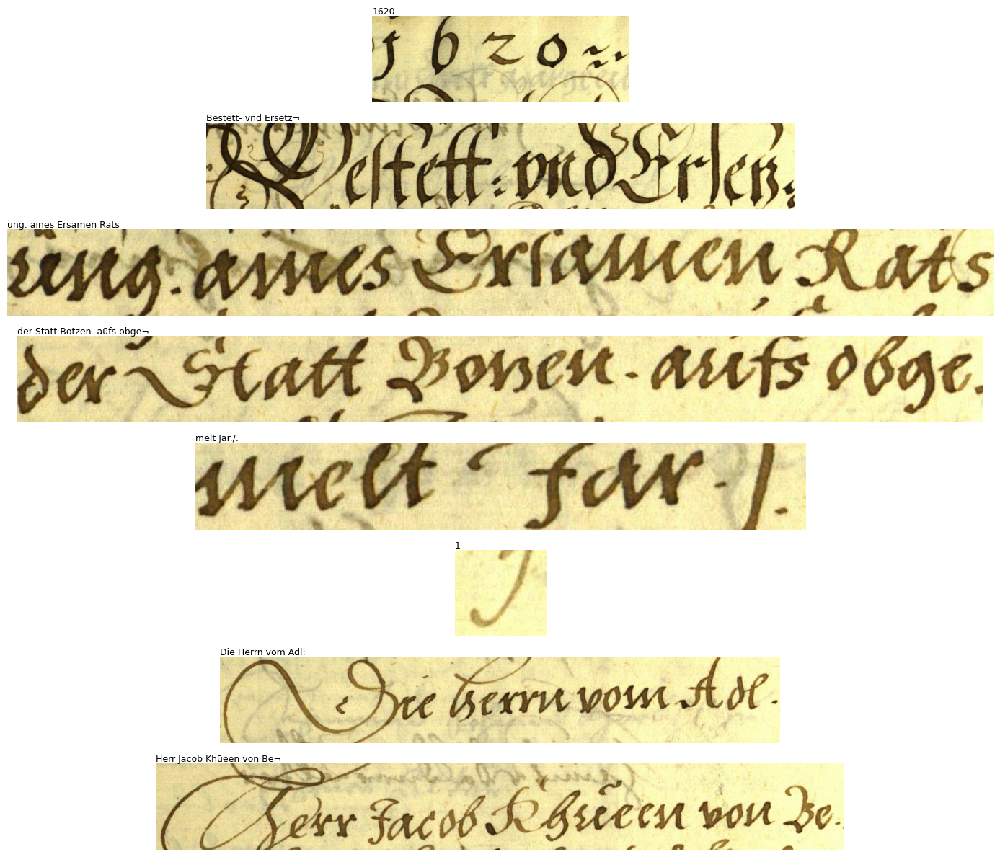

In [14]:
# Visualise 8 cropped line images with their transcriptions
page_img = Image.open(sample_img_path)
tree     = ET.parse(sample_xml_path)
lines    = tree.getroot().findall(".//p:TextLine", ns)

# Pick 8 lines with non-empty transcriptions
samples = []
for line in lines:
    u = line.find(".//p:Unicode", ns)
    if u is None or not (u.text or "").strip():
        continue
    coords = line.find("p:Coords", ns)
    pts    = coords.get("points", "")
    xs     = [int(p.split(",")[0]) for p in pts.split()]
    ys     = [int(p.split(",")[1]) for p in pts.split()]
    bbox   = (min(xs), min(ys), max(xs), max(ys))
    samples.append((bbox, u.text.strip()))
    if len(samples) == 8:
        break

fig, axes = plt.subplots(len(samples), 1, figsize=(14, 12))
for ax, (bbox, text) in zip(axes, samples):
    crop = page_img.crop(bbox)
    ax.imshow(crop)
    ax.set_title(text, fontsize=9, loc="left", pad=2)
    ax.axis("off")

plt.tight_layout()
plt.show()

## Step 2 – Extract Line Crops & Build DataFrame

For each split we parse all PAGE XMLs and extract one record per text line:
- **`image_path`** — path to the full-page JPG
- **`bbox`** — `(x1, y1, x2, y2)` bounding box computed from the polygon coords
- **`transcription`** — `<Unicode>` text

Only lines from `paragraph` and `heading` regions are kept.  
`page-number` (349 lines) and `marginalia` (877 lines) are excluded — they are  
single digits or side-notes in different handwriting that would hurt training quality.

In [15]:
import pandas as pd

KEEP_REGION_TYPES = {"paragraph", "heading"}

def parse_page_xml(xml_path: Path, image_path: Path) -> list:
    """
    Parse one PAGE XML and return a list of dicts, one per usable text line.
    Only lines from paragraph/heading regions are included.
    Regions with no type attribute (test set) are included as well.
    """
    ns = {"p": PAGE_NS}
    tree = ET.parse(xml_path)
    root = tree.getroot()
    records = []

    for region in root.findall(".//p:TextRegion", ns):
        rtype = region.get("type")
        # skip only if a type is explicitly set and it's not paragraph/heading
        if rtype is not None and rtype not in KEEP_REGION_TYPES:
            continue

        for line in region.findall(".//p:TextLine", ns):
            u = line.find(".//p:Unicode", ns)
            if u is None or not (u.text or "").strip():
                continue  # skip empty transcriptions

            coords = line.find("p:Coords", ns)
            pts    = coords.get("points", "") if coords is not None else ""
            if not pts:
                continue

            xs   = [int(p.split(",")[0]) for p in pts.split()]
            ys   = [int(p.split(",")[1]) for p in pts.split()]
            bbox = (min(xs), min(ys), max(xs), max(ys))

            # Skip degenerate bounding boxes (width or height = 0)
            if bbox[2] <= bbox[0] or bbox[3] <= bbox[1]:
                continue

            records.append({
                "image_path":    str(image_path),
                "bbox":          bbox,
                "transcription": u.text.strip(),
            })

    return records


def build_dataframe(split_name: str) -> pd.DataFrame:
    """Build image–bbox–transcription DataFrame for one split."""
    paths   = SPLITS[split_name]
    records = []

    for xml_file in sorted(paths["xmls"].glob("*.xml")):
        img_file = paths["images"] / (xml_file.stem + ".JPG")
        if not img_file.exists():
            continue
        records.extend(parse_page_xml(xml_file, img_file))

    return pd.DataFrame(records)


df_train = build_dataframe("train")
df_val   = build_dataframe("val")
df_test  = build_dataframe("test")

print(f"Train : {len(df_train):>5} lines  (paragraph + heading regions)")
print(f"Val   : {len(df_val):>5} lines")
print(f"Test  : {len(df_test):>5} lines  (no region type in test XMLs → all included)")

Train :  7140 lines  (paragraph + heading regions)
Val   :   894 lines
Test  :  1138 lines  (no region type in test XMLs → all included)


In [16]:
df_train.head(10)

,image_path,bbox,transcription
0,../data/READDataset/Training/Images/Seite0001.JPG,"(795, 138, 1590, 407)",1620
1,../data/READDataset/Training/Images/Seite0001.JPG,"(285, 415, 1828, 642)",Bestett- vnd Ersetz¬
2,../data/READDataset/Training/Images/Seite0001.JPG,"(577, 633, 1784, 739)",üng. aines Ersamen Rats
3,../data/READDataset/Training/Images/Seite0001.JPG,"(583, 728, 1809, 838)",der Statt Botzen. aūfs obge¬
4,../data/READDataset/Training/Images/Seite0001.JPG,"(766, 831, 1358, 915)",melt Jar./.
5,../data/READDataset/Training/Images/Seite0001.JPG,"(393, 1020, 1693, 1221)",Die Herrn vom Adl:
6,../data/READDataset/Training/Images/Seite0001.JPG,"(244, 1209, 1810, 1406)",Herr Jacob Khūeen von Be¬
7,../data/READDataset/Training/Images/Seite0001.JPG,"(486, 1384, 1810, 1505)",läsÿ Zū Liechtenberg vnd Gandegg
8,../data/READDataset/Training/Images/Seite0001.JPG,"(432, 1488, 1756, 1606)",Freÿherr aūf Neūen Lempach etc.
9,../data/READDataset/Training/Images/Seite0001.JPG,"(338, 1817, 1737, 1984)",Herr Ernreich von Traūt¬


In [17]:
# Crop size statistics — relevant for choosing max_target_length in Step 5
crop_widths  = [b[2] - b[0] for b in df_train["bbox"]]
crop_heights = [b[3] - b[1] for b in df_train["bbox"]]
trans_lens   = df_train["transcription"].str.len()

print("Crop width  (px): "
      f"min={min(crop_widths)}, max={max(crop_widths)}, "
      f"median={sorted(crop_widths)[len(crop_widths)//2]}")
print("Crop height (px): "
      f"min={min(crop_heights)}, max={max(crop_heights)}, "
      f"median={sorted(crop_heights)[len(crop_heights)//2]}")
print(f"\nTranscription length (chars): "
      f"min={trans_lens.min()}, max={trans_lens.max()}, "
      f"mean={trans_lens.mean():.1f}, 95th pct={int(trans_lens.quantile(0.95))}")

Crop width  (px): min=61, max=1626, median=1096
Crop height (px): min=28, max=514, median=115

Transcription length (chars): min=1, max=43, mean=24.6, 95th pct=32


## Step 3 – Preprocess Images

Line images are cropped on-the-fly from the full-page JPGs using the bounding boxes from Step 2.  
The `load_line_image` function opens the page, crops the bbox, and returns an RGB PIL image.  
TrOCR's processor handles resizing (384 × 384) and normalisation automatically.

In [18]:
import random
import numpy as np
import torch

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark     = False
print(f"Random seed set to {SEED}")

Random seed set to 42


Crop size : (1212, 105)  (width × height in px)
Mode      : RGB
Text      : 'mansdorf. Zū NeūPerg. Freÿ¬'


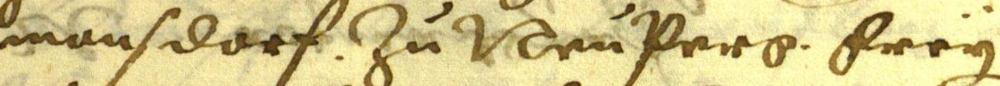

In [19]:
# Cache for open page images — avoids re-opening the same JPG for every line on a page
_page_cache: dict = {}

def load_line_image(image_path: str, bbox: tuple) -> Image.Image:
    """Crop one text line from a full-page JPG and return an RGB PIL image."""
    if image_path not in _page_cache:
        _page_cache[image_path] = Image.open(image_path).convert("RGB")
    return _page_cache[image_path].crop(bbox)


# Sanity check — one crop
row  = df_train.iloc[10]
crop = load_line_image(row["image_path"], row["bbox"])
print(f"Crop size : {crop.size}  (width × height in px)")
print(f"Mode      : {crop.mode}")
print(f"Text      : '{row['transcription']}'")
crop

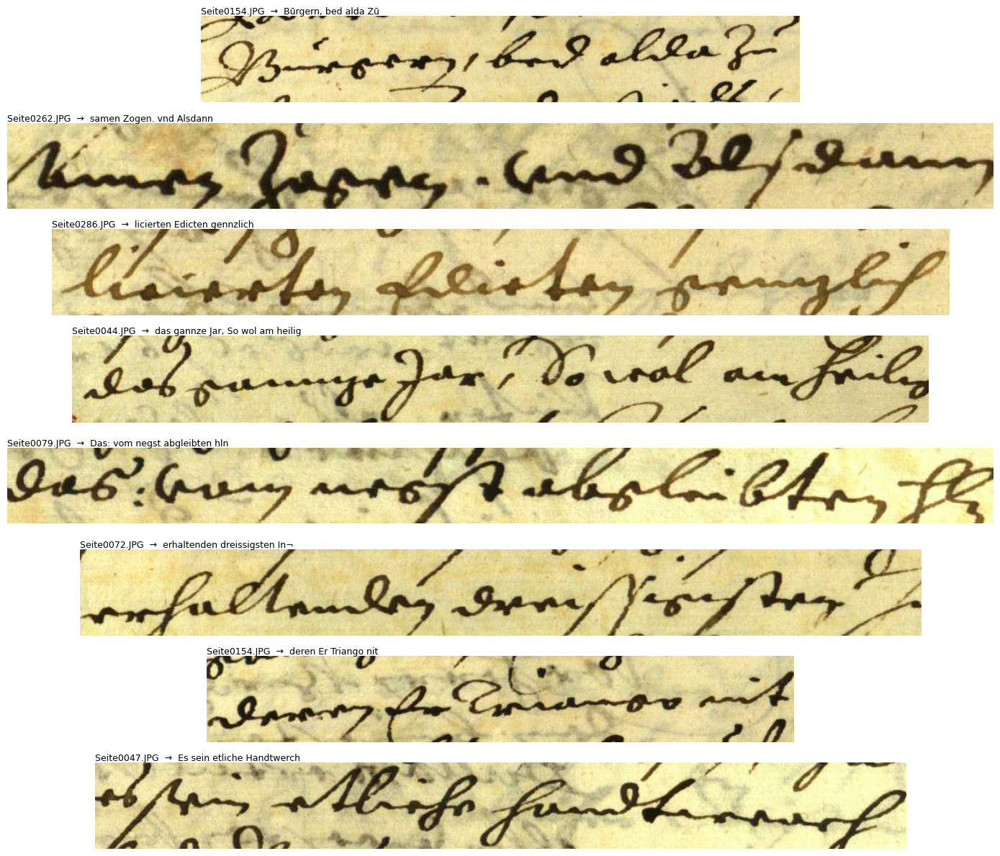

In [20]:
# Visualise 8 random training crops from different pages
sample = df_train.sample(8, random_state=SEED).reset_index(drop=True)

fig, axes = plt.subplots(8, 1, figsize=(14, 12))
for ax, (_, row) in zip(axes, sample.iterrows()):
    crop = load_line_image(row["image_path"], row["bbox"])
    ax.imshow(crop)
    ax.set_title(
        f"{Path(row['image_path']).name}  →  {row['transcription']}",
        fontsize=9, loc="left", pad=2
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

## Step 4 – Build Dataset Object

The `READDataset` class connects the DataFrame to TrOCR:
- Images are cropped on-the-fly from the full-page JPG using `load_line_image`
- The `TrOCRProcessor` resizes to 384 × 384 and normalises
- Transcriptions are tokenised; padding tokens are replaced with `-100` (ignored in loss)

The processor is loaded from `checkpoints/best/` — the Bentham fine-tuned checkpoint —  
so the tokenizer vocabulary is already adapted to historical handwriting.

In [21]:
from transformers import TrOCRProcessor

CHECKPOINT_DIR = Path("../checkpoints/best")

processor = TrOCRProcessor.from_pretrained(CHECKPOINT_DIR)
print("Processor loaded from:", CHECKPOINT_DIR)

Processor loaded from: ../checkpoints/best


In [22]:
from torch.utils.data import Dataset, DataLoader

class READDataset(Dataset):
    def __init__(self, df, processor, max_target_length=128):
        self.df               = df
        self.processor        = processor
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        # Crop line from full-page image and preprocess
        img          = load_line_image(row["image_path"], row["bbox"])
        pixel_values = self.processor(images=img, return_tensors="pt").pixel_values.squeeze(0)

        # Tokenise transcription
        labels = self.processor.tokenizer(
            row["transcription"],
            padding="max_length",
            max_length=self.max_target_length,
            truncation=True,
            return_tensors="pt",
        ).input_ids.squeeze(0)

        # Replace padding token IDs with -100 → ignored in Cross-Entropy Loss
        labels[labels == self.processor.tokenizer.pad_token_id] = -100

        return {"pixel_values": pixel_values, "labels": labels}

In [23]:
# Instantiate datasets
train_dataset = READDataset(df_train, processor)
val_dataset   = READDataset(df_val,   processor)
test_dataset  = READDataset(df_test,  processor)

# Sanity check — one sample
sample = train_dataset[0]
print(f"pixel_values shape : {sample['pixel_values'].shape}")   # expected: (3, 384, 384)
print(f"labels shape       : {sample['labels'].shape}")         # expected: (128,)
print(f"labels (first 10)  : {sample['labels'][:10].tolist()}")

pixel_values shape : torch.Size([3, 384, 384])
labels shape       : torch.Size([128])
labels (first 10)  : [0, 1549, 844, 2, -100, -100, -100, -100, -100, -100]


In [24]:
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_dataset,   batch_size=16, shuffle=False, num_workers=0)

batch = next(iter(train_loader))
print(f"Batch pixel_values : {batch['pixel_values'].shape}")  # (16, 3, 384, 384)
print(f"Batch labels       : {batch['labels'].shape}")        # (16, 128)
print("DataLoader OK.")

Batch pixel_values : torch.Size([16, 3, 384, 384])
Batch labels       : torch.Size([16, 128])
DataLoader OK.


## Step 5 – Load & Configure TrOCR

The model is loaded from `checkpoints/best/` (Bentham fine-tuned checkpoint) — not from  
`microsoft/trocr-base-handwritten` — so it already knows historical Latin handwriting.  
We continue fine-tuning on German script with a lower learning rate (5e-6 instead of 1e-5)  
to make smaller updates and prevent overwriting what the model learned on Bentham.

In [25]:
from transformers import VisionEncoderDecoderModel

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# Continue from the Bentham fine-tuned checkpoint
model = VisionEncoderDecoderModel.from_pretrained(CHECKPOINT_DIR)

# Gradient checkpointing: saves ~60-70% VRAM at the cost of ~20% longer training time
model.config.use_cache = False
model.gradient_checkpointing_enable()

model.to(device)
print(f"Model loaded from : {CHECKPOINT_DIR}")
print("Gradient checkpointing active.")

Device: cuda
Model loaded from : ../checkpoints/best
Gradient checkpointing active.


In [26]:
from torch.optim import AdamW
from transformers import get_scheduler

EPOCHS        = 30
LEARNING_RATE = 5e-6   # lower than Bentham (1e-5): continued fine-tuning requires smaller updates
WARMUP_RATIO  = 0.1

total_steps  = EPOCHS * len(train_loader)
warmup_steps = int(total_steps * WARMUP_RATIO)

optimizer = AdamW(model.parameters(), lr=LEARNING_RATE)

scheduler = get_scheduler(
    name="linear",
    optimizer=optimizer,
    num_warmup_steps=warmup_steps,
    num_training_steps=total_steps,
)

print(f"Total training steps : {total_steps}")
print(f"Warmup steps         : {warmup_steps}")
print(f"Optimizer            : AdamW, LR={LEARNING_RATE}")
print(f"Scheduler            : Linear Warmup → Linear Decay")

Total training steps : 13410
Warmup steps         : 1341
Optimizer            : AdamW, LR=5e-06
Scheduler            : Linear Warmup → Linear Decay


## Step 6 – Training Loop

Per epoch: train → measure validation CER → save checkpoint → check early stopping.  
Patience = 3 epochs without improvement in validation CER.  
Best checkpoint saved to `../checkpoints/best_read/`.

In [27]:
import evaluate

cer_metric = evaluate.load("cer")

def compute_cer(model, dataloader, processor, device):
    """Compute CER on a dataloader split."""
    model.eval()
    all_preds, all_refs = [], []

    with torch.no_grad():
        for batch in dataloader:
            pixel_values = batch["pixel_values"].to(device)
            labels       = batch["labels"].clone()

            generated_ids = model.generate(pixel_values, max_new_tokens=128)
            preds = processor.batch_decode(generated_ids, skip_special_tokens=True)

            labels[labels == -100] = processor.tokenizer.pad_token_id
            refs = processor.batch_decode(labels, skip_special_tokens=True)

            all_preds.extend(preds)
            all_refs.extend(refs)

    return cer_metric.compute(predictions=all_preds, references=all_refs)

In [28]:
from tqdm.notebook import tqdm

PATIENCE           = 3
READ_CHECKPOINT_DIR = Path("../checkpoints/best_read")
READ_CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)

best_cer         = float("inf")
patience_counter = 0
history          = []
scaler           = torch.amp.GradScaler("cuda")

if torch.cuda.is_available():
    torch.cuda.empty_cache()

for epoch in range(1, EPOCHS + 1):

    # ── Training ────────────────────────────────────────────────────────────
    model.train()
    total_loss = 0.0

    for batch in tqdm(train_loader, desc=f"Epoch {epoch:02d}/{EPOCHS} [train]", leave=False):
        pixel_values = batch["pixel_values"].to(device)
        labels       = batch["labels"].to(device)

        optimizer.zero_grad()

        with torch.amp.autocast("cuda"):
            outputs = model(pixel_values=pixel_values, labels=labels)

        scaler.scale(outputs.loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()

        total_loss += outputs.loss.item()

    avg_loss = total_loss / len(train_loader)

    # ── Validation CER ──────────────────────────────────────────────────────
    val_cer = compute_cer(model, val_loader, processor, device)

    history.append({"epoch": epoch, "train_loss": avg_loss, "val_cer": val_cer})
    print(f"Epoch {epoch:02d} | Loss: {avg_loss:.4f} | Val CER: {val_cer:.4f}", end="")

    # ── Checkpoint & Early Stopping ─────────────────────────────────────────
    if val_cer < best_cer:
        best_cer         = val_cer
        patience_counter = 0
        model.save_pretrained(READ_CHECKPOINT_DIR)
        processor.save_pretrained(READ_CHECKPOINT_DIR)
        print(f"  ✓ Best model saved")
    else:
        patience_counter += 1
        print(f"  ✗ No improvement ({patience_counter}/{PATIENCE})")
        if patience_counter >= PATIENCE:
            print(f"\nEarly stopping after epoch {epoch} — best Val CER: {best_cer:.4f}")
            break

Epoch 01/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 01 | Loss: 4.5992 | Val CER: 0.2989  ✓ Best model saved


Epoch 02/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 02 | Loss: 1.3665 | Val CER: 0.1609  ✓ Best model saved


Epoch 03/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 03 | Loss: 0.7656 | Val CER: 0.1236  ✓ Best model saved


Epoch 04/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 04 | Loss: 0.5091 | Val CER: 0.0974  ✓ Best model saved


Epoch 05/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 05 | Loss: 0.3679 | Val CER: 0.0892  ✓ Best model saved


Epoch 06/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 06 | Loss: 0.2853 | Val CER: 0.0798  ✓ Best model saved


Epoch 07/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 07 | Loss: 0.2391 | Val CER: 0.0790  ✓ Best model saved


Epoch 08/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 08 | Loss: 0.1765 | Val CER: 0.0763  ✓ Best model saved


Epoch 09/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 09 | Loss: 0.1433 | Val CER: 0.0727  ✓ Best model saved


Epoch 10/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 10 | Loss: 0.1140 | Val CER: 0.0752  ✗ No improvement (1/3)


Epoch 11/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 11 | Loss: 0.0943 | Val CER: 0.0762  ✗ No improvement (2/3)


Epoch 12/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 12 | Loss: 0.0755 | Val CER: 0.0695  ✓ Best model saved


Epoch 13/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 13 | Loss: 0.0606 | Val CER: 0.0709  ✗ No improvement (1/3)


Epoch 14/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 14 | Loss: 0.0520 | Val CER: 0.0703  ✗ No improvement (2/3)


Epoch 15/30 [train]:   0%|          | 0/447 [00:00<?, ?it/s]

Epoch 15 | Loss: 0.0482 | Val CER: 0.0743  ✗ No improvement (3/3)

Early stopping after epoch 15 — best Val CER: 0.0695


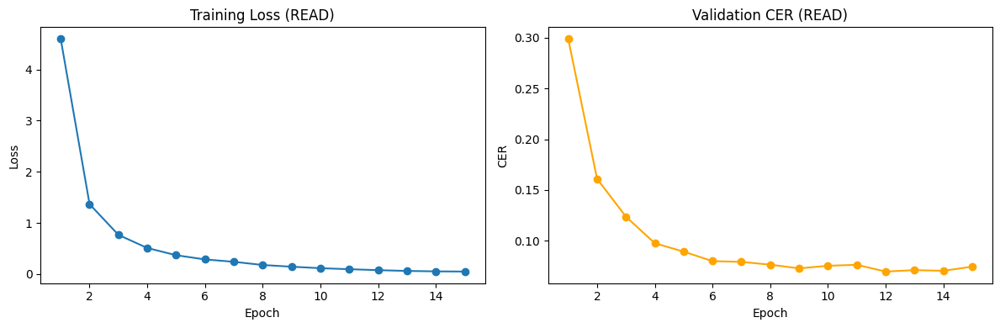


Best Validation CER: 0.0695 (Epoch 12)


In [29]:
# Learning curve after training
history_df = pd.DataFrame(history)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(history_df["epoch"], history_df["train_loss"], marker="o")
ax1.set_title("Training Loss (READ)")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Loss")

ax2.plot(history_df["epoch"], history_df["val_cer"], marker="o", color="orange")
ax2.set_title("Validation CER (READ)")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("CER")

plt.tight_layout()
plt.show()
print(f"\nBest Validation CER: {history_df['val_cer'].min():.4f} (Epoch {history_df['val_cer'].idxmin() + 1})")

## Step 7 – Evaluation

Load best checkpoint → CER & WER on the test set (quantitative) → sample predictions (qualitative).  
This cell block is self-contained and can be run after a kernel restart without retraining.

In [30]:
import torch
import evaluate
import xml.etree.ElementTree as ET
import pandas as pd
from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
from transformers import VisionEncoderDecoderModel, TrOCRProcessor

# ── Paths ────────────────────────────────────────────────────────────────────
READ_DIR           = Path("../data/READDataset")
READ_CHECKPOINT_DIR = Path("../checkpoints/best_read")
PAGE_NS            = "http://schema.primaresearch.org/PAGE/gts/pagecontent/2013-07-15"
KEEP_REGION_TYPES  = {"paragraph", "heading"}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── Rebuild test DataFrame ───────────────────────────────────────────────────
def _parse_xml(xml_path, image_path):
    ns = {"p": PAGE_NS}
    records = []
    for region in ET.parse(xml_path).getroot().findall(".//p:TextRegion", ns):
        rtype = region.get("type")
        if rtype is not None and rtype not in KEEP_REGION_TYPES:
            continue
        for line in region.findall(".//p:TextLine", ns):
            u      = line.find(".//p:Unicode", ns)
            coords = line.find("p:Coords", ns)
            if u is None or not (u.text or "").strip() or coords is None:
                continue
            pts  = coords.get("points", "")
            xs   = [int(p.split(",")[0]) for p in pts.split()]
            ys   = [int(p.split(",")[1]) for p in pts.split()]
            bbox = (min(xs), min(ys), max(xs), max(ys))
            if bbox[2] > bbox[0] and bbox[3] > bbox[1]:
                records.append({"image_path": str(image_path), "bbox": bbox,
                                 "transcription": u.text.strip()})
    return records

test_xml_dir = READ_DIR / "Test-ICFHR-2016" / "page"
test_img_dir = READ_DIR / "Test-ICFHR-2016"
records = []
for xml_file in sorted(test_xml_dir.glob("*.xml")):
    img_file = test_img_dir / (xml_file.stem + ".JPG")
    if img_file.exists():
        records.extend(_parse_xml(xml_file, img_file))
df_test_eval = pd.DataFrame(records)

# ── Load checkpoint ──────────────────────────────────────────────────────────
best_model     = VisionEncoderDecoderModel.from_pretrained(READ_CHECKPOINT_DIR).to(device)
best_processor = TrOCRProcessor.from_pretrained(READ_CHECKPOINT_DIR)
best_model.eval()

print(f"Device     : {device}")
print(f"Checkpoint : {READ_CHECKPOINT_DIR}")
print(f"Test lines : {len(df_test_eval)}")

Device     : cuda
Checkpoint : ../checkpoints/best_read
Test lines : 1138


In [31]:
class _READDataset(Dataset):
    def __init__(self, df, processor, max_target_length=128):
        self.df, self.processor = df, processor
        self.max_target_length  = max_target_length
        self._cache = {}

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        if row["image_path"] not in self._cache:
            self._cache[row["image_path"]] = Image.open(row["image_path"]).convert("RGB")
        img          = self._cache[row["image_path"]].crop(row["bbox"])
        pixel_values = self.processor(images=img, return_tensors="pt").pixel_values.squeeze(0)
        labels = self.processor.tokenizer(
            row["transcription"], padding="max_length",
            max_length=self.max_target_length, truncation=True, return_tensors="pt",
        ).input_ids.squeeze(0)
        labels[labels == self.processor.tokenizer.pad_token_id] = -100
        return {"pixel_values": pixel_values, "labels": labels}


cer_metric = evaluate.load("cer")
wer_metric = evaluate.load("wer")

test_loader = DataLoader(
    _READDataset(df_test_eval, best_processor),
    batch_size=16, shuffle=False, num_workers=0,
)

all_preds, all_refs = [], []

with torch.no_grad():
    for batch in tqdm(test_loader, desc="Evaluating"):
        pixel_values = batch["pixel_values"].to(device)
        labels       = batch["labels"].clone()

        generated_ids = best_model.generate(pixel_values, max_new_tokens=128)
        preds = best_processor.batch_decode(generated_ids, skip_special_tokens=True)

        labels[labels == -100] = best_processor.tokenizer.pad_token_id
        refs = best_processor.batch_decode(labels, skip_special_tokens=True)

        all_preds.extend(preds)
        all_refs.extend(refs)

cer = cer_metric.compute(predictions=all_preds, references=all_refs)
wer = wer_metric.compute(predictions=all_preds, references=all_refs)

print(f"\nTest CER : {cer:.4f}  ({cer*100:.2f}%)")
print(f"Test WER : {wer:.4f}  ({wer*100:.2f}%)")

Evaluating:   0%|          | 0/72 [00:00<?, ?it/s]


Test CER : 0.0736  (7.36%)
Test WER : 0.3056  (30.56%)


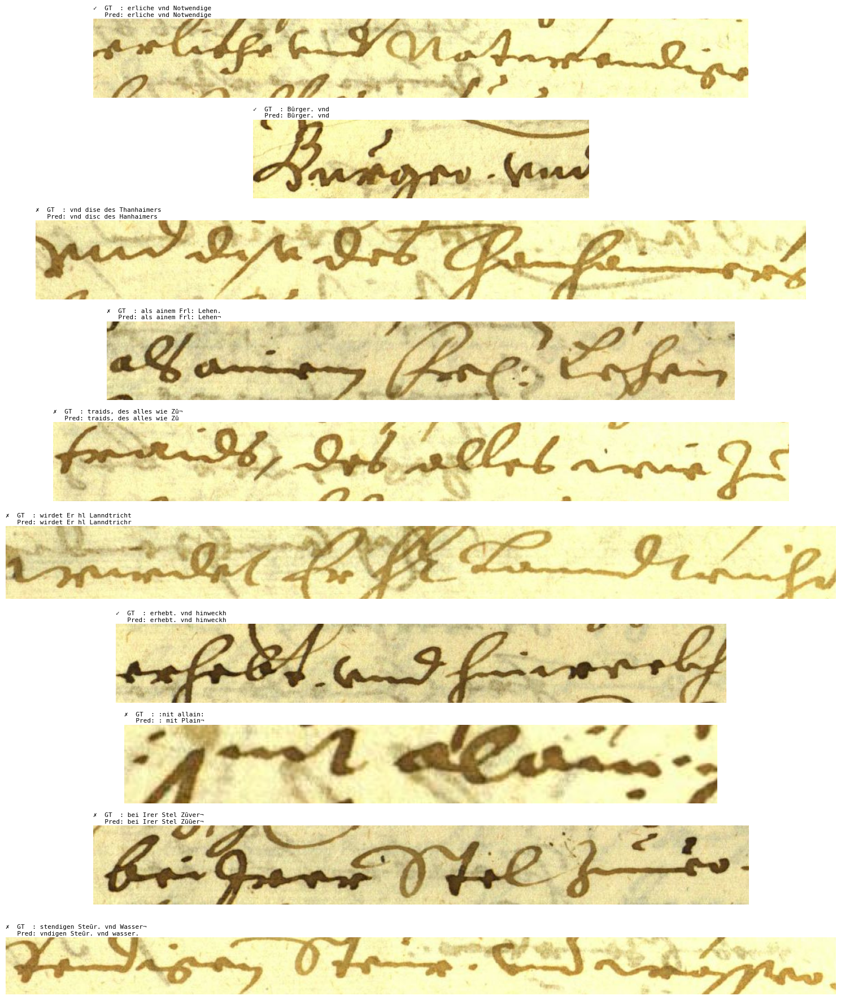

In [32]:
# Qualitative examples: 10 random test lines with image, prediction and ground truth
import matplotlib.pyplot as plt

sample_idx = df_test_eval.sample(10, random_state=42).index.tolist()

fig, axes = plt.subplots(10, 1, figsize=(15, 18))
for ax, idx in zip(axes, sample_idx):
    row  = df_test_eval.iloc[idx]
    img  = Image.open(row["image_path"]).crop(row["bbox"])
    pred = all_preds[idx]
    ref  = all_refs[idx]
    match = "✓" if pred.strip() == ref.strip() else "✗"
    ax.imshow(img)
    ax.set_title(
        f"{match}  GT  : {ref}\n   Pred: {pred}",
        fontsize=8, loc="left", pad=3, family="monospace",
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

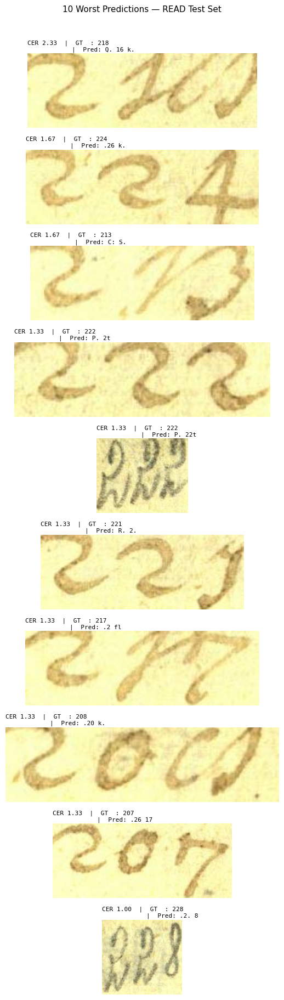

Saved to ../checkpoints/best_read/worst_predictions.png


In [34]:
# Error analysis: 10 worst lines (highest per-line CER) with visual crop
from jiwer import cer as line_cer

errors = []
for idx, (pred, ref) in enumerate(zip(all_preds, all_refs)):
    if ref.strip():
        errors.append((line_cer(ref, pred), idx, ref, pred))

errors.sort(reverse=True)
worst = errors[:10]

fig, axes = plt.subplots(10, 1, figsize=(15, 18))
for ax, (c, idx, ref, pred) in zip(axes, worst):
    row  = df_test_eval.iloc[idx]
    img  = Image.open(row["image_path"]).crop(row["bbox"])
    ax.imshow(img)
    ax.set_title(
        f"CER {c:.2f}  |  GT  : {ref}\n"
        f"            |  Pred: {pred}",
        fontsize=8, loc="left", pad=3, family="monospace",
    )
    ax.axis("off")

plt.suptitle("10 Worst Predictions — READ Test Set", fontsize=11, y=1.01)
plt.tight_layout()

output_path = Path("../checkpoints/best_read/worst_predictions.png")
plt.savefig(output_path, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved to {output_path}")